# Microvilli orientation
- Visualize Anastasia's microvilli orientation data (more detailed excel sent in Aug 2021)
- Determine if microvilli twist is more or less in the DRA
- Determine orthogonality/relative orientation of photoreceptor subtypes

In [1]:
import numpy as np
import pandas as pd
import os.path
import math
import matplotlib.pyplot as plt
from typing import Tuple
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import mannwhitneyu
from sklearn.decomposition import PCA
import os.path

from cx_analysis.vis.hex_lattice import hexplot
from cx_analysis.utils import index_by_om, yymmdd_today
from cx_analysis.vis.fig_tools import linear_cmap, subtype_cm

plt.style.use('../cx_analysis/vis/lamina.mplstyle') 

## Parse and organize data 
Imported data:
- excel file containing microvilli orientation 210921-microvilli-angles.xlsx (from AM)
- csv containing an offset angle for each ommatidia so that 0 degrees points approx to dorsal neighhbor/180 degrees points to ventral neighbor (from NC)

### Angle measurements
- Measurements taken on transformed cutouts of the FIB-SEM dataset oriented so that each image shows a serial cross section of the ommatidium. Note: some of them have a lower 
- Each rhabdomere sampled at 10 points evenly spaced along its length. Because of this the z index of a given nth measurement is often different for different photoreceptors in an ommatidium
- R7 typically begins the at the first (more distal) compared to the other rhabomeres, its microvilli orientation at this first distal slice becomes the 0 angle for every measurement taken for this rhabdom/ommatidium.


In [2]:
save_figs = True
fig_path = os.path.expanduser(f'~/Dropbox (Simons Foundation)/lamina_figures/{yymmdd_today()}_')

st_cm = subtype_cm()
tp = '210809'
xl_dir = f'~/Data/{tp}_lamina/210921-microvilli-angles.xlsx'
full_df = pd.read_excel(xl_dir, sheet_name='Sheet1', header=None, index_col=None)

# Adding this to the angles make them relative to the eye's meridean (dorsal neighbor) 
offsets = pd.read_csv(f'~/Data/{tp}_lamina/microvilli-offsets.csv', header=None, index_col=0)

In [3]:
# The excel file contains consequtive table for each ommatidium, the formatting is very consistent
twist = []
c5_offset = 0  # not needed anymore
inverted = []

for i in range(0, 29):  # ommatidia
    # TODO: there isn't an offset anymore -- all om are 16 rows (with 3 blank rows underneath)
    this_range = full_df.loc[i * 16 + c5_offset: i * 16 + 13 + c5_offset].reset_index(drop=True)
    #print(this_range)
    
    ### Pick out data ### 
    this_om = this_range.iloc[0, 0] # each table starts with the om ID e.g A4 in first cell
    rows=10
    z_st_cols = this_range.iloc[3, 13:] # cells containing z-index each angle measurement was taken
    # 
    
    assert(len(this_om) == 2)  # check om name
    assert(len(z_st_cols) == 9)  # check that there are 9 photoreceptors

    for ii, this_st in this_range.iloc[0, 4:13].items():  # subtypes 
        if '(' in this_st:  # some have the old subtype nomenclature in ()
            this_st = this_st.split('(')[0]
        this_st = this_st.strip().upper()
#         if this_st == "R7'":
#             this_st = 'R7p'
        z_col = z_st_cols[z_st_cols == this_st.lower()].index[0]
        
        if this_range.iloc[2, 4] < this_range.iloc[3, 4]: # start/end index for R1
            z_inds = this_range.iloc[4:, z_col]
        else:
            z_inds = this_range.iloc[4:, z_col] * -1.0
            inverted.append(this_om)
        #display(this_range.loc[4:, ii])
        
        this_range.iloc[4:, ii] = [m if m != '-' else np.nan for m in this_range.loc[4:, ii].values]
        ### OFFSET ADDED HERE ###
        plus_offset = this_range.iloc[4:, ii] + offsets.loc[this_om, 1]
        twist.append(pd.DataFrame({'om': [this_om]*rows, 
                                     'subtype': [this_st]*rows, 
                                     'z-index': z_inds, 
                                     'angle': plus_offset, 
                                     'angle-before-offset': this_range.iloc[4:, ii]}))
        
twist_df = pd.concat(twist, ignore_index=True)
twist_df = twist_df.astype({'z-index': float, # because there are NaNs
                           'angle': float, 
                           'angle-before-offset': float})

twist_df = twist_df.sort_values(by=['om', 'subtype', 'z-index'])

for om in inverted:  # those with the first z being the most proximal 
    # Add negative sign to indices of stacks that start proximal so the direction is distal->proximal
    twist_df.loc[twist_df.om == om, 'angle'] = twist_df.loc[twist_df.om == om, 'angle'] * -1.0

display(twist_df.describe())

,z-index,angle,angle-before-offset
count,2610.000000,2596.000000,2596.000000
mean,-1090.678927,20.961768,-0.361260
std,1703.096854,115.544786,101.914057
min,-3343.000000,-224.700000,-180.000000
25%,-2291.000000,-67.575000,-84.250000
50%,-1763.500000,8.650000,3.100000
75%,-913.500000,108.900000,83.550000
max,2967.000000,329.300000,179.900000


In [4]:
display(offsets.loc['E7'])

display(twist_df.loc[(twist_df['om'] == 'E7') & (twist_df['subtype'] == 'R2')])

display(offsets.loc['A1'])

display(twist_df.loc[(twist_df['om'] == 'A1') & (twist_df['subtype'] == 'R7')])

1    21.0
Name: E7, dtype: float64

,om,subtype,z-index,angle,angle-before-offset
460,E7,R2,965.0,130.9,109.9
461,E7,R2,1135.0,151.7,130.7
462,E7,R2,1305.0,148.4,127.4
463,E7,R2,1475.0,146.9,125.9
464,E7,R2,1645.0,156.2,135.2
465,E7,R2,1815.0,161.0,140.0
466,E7,R2,1985.0,168.5,147.5
467,E7,R2,2155.0,165.0,144.0
468,E7,R2,2325.0,161.8,140.8
469,E7,R2,2495.0,-101.8,-122.8


1    9.6
Name: A1, dtype: float64

,om,subtype,z-index,angle,angle-before-offset
2410,A1,R7,-2689.0,-9.6,0.0
2411,A1,R7,-2594.0,-4.5,-5.1
2412,A1,R7,-2499.0,20.1,-29.7
2413,A1,R7,-2404.0,68.7,-78.3
2414,A1,R7,-2309.0,72.5,-82.1
2415,A1,R7,-2214.0,72.5,-82.1
2416,A1,R7,-2119.0,78.9,-88.5
2417,A1,R7,-2024.0,82.0,-91.6
2418,A1,R7,-1929.0,77.3,-86.9
2419,A1,R7,-1834.0,81.3,-90.9


## Angle conversion
- Angles in the excel file are expressed as -180 to 180, where the former is measured counterclockwise from 0
- convert_angle(Series) will wrap measured angles from (-180, 180) to (0, 180) and then convert to radians

In [5]:
def convert_angle(angles: pd.Series) -> pd.Series:
    """
    convert from (-180, +180) to 0 - 180 (in radians)
    """
    angles = angles % 180.0
    angles = np.radians(angles) 
    return angles

#!#
# def convert_angle_hist(angles: pd.Series) -> pd.Series:
#     """
#     convert from -180 - +180 to 0 - 180 (in radians)
#     """
#     angles = (angles % 180.0) + 180.0 
#     angles = np.radians(angles) 
#     return angles


test_angles = [-170.0, 170.0, -10.1, 10.1, -220, 220]
display(convert_angle(pd.Series(test_angles)))

twist_df.loc[:, 'conv-angle'] = convert_angle(twist_df.angle)
twist_df.loc[:, 'sin-angle'] = np.sin(twist_df.loc[:, 'conv-angle'])
twist_df.loc[:, 'cos-angle'] = np.cos(twist_df.loc[:, 'conv-angle'])
display(twist_df.describe())

0    0.174533
1    2.967060
2    2.965314
3    0.176278
4    2.443461
5    0.698132
dtype: float64

,z-index,angle,angle-before-offset,conv-angle,sin-angle,cos-angle
count,2610.000000,2596.000000,2596.000000,2596.000000,2596.000000,2596.000000
mean,-1090.678927,20.961768,-0.361260,1.654679,0.626914,-0.070623
std,1703.096854,115.544786,101.914057,0.918729,0.325102,0.704650
min,-3343.000000,-224.700000,-180.000000,0.000000,0.000000,-0.999994
25%,-2291.000000,-67.575000,-84.250000,0.924588,0.336684,-0.770513
50%,-1763.500000,8.650000,3.100000,1.653699,0.715693,-0.082808
75%,-913.500000,108.900000,83.550000,2.450442,0.934826,0.602163
max,2967.000000,329.300000,179.900000,3.138102,1.000000,1.000000


In [6]:
display(offsets.loc['E7'])

display(twist_df.loc[(twist_df['om'] == 'E7') & (twist_df['subtype'] == 'R2')])

display(offsets.loc['A5'])

display(twist_df.loc[(twist_df['om'] == 'A5') & (twist_df['subtype'] == 'R3')])

1    21.0
Name: E7, dtype: float64

,om,subtype,z-index,angle,angle-before-offset,conv-angle,sin-angle,cos-angle
460,E7,R2,965.0,130.9,109.9,2.284636,0.755853,-0.654741
461,E7,R2,1135.0,151.7,130.7,2.647664,0.474088,-0.880477
462,E7,R2,1305.0,148.4,127.4,2.590069,0.523986,-0.851727
463,E7,R2,1475.0,146.9,125.9,2.563889,0.546102,-0.837719
464,E7,R2,1645.0,156.2,135.2,2.726204,0.403545,-0.914960
465,E7,R2,1815.0,161.0,140.0,2.809980,0.325568,-0.945519
466,E7,R2,1985.0,168.5,147.5,2.940880,0.199368,-0.979925
467,E7,R2,2155.0,165.0,144.0,2.879793,0.258819,-0.965926
468,E7,R2,2325.0,161.8,140.8,2.823943,0.312335,-0.949972
469,E7,R2,2495.0,-101.8,-122.8,1.364847,0.978867,0.204496


1    46.6
Name: A5, dtype: float64

,om,subtype,z-index,angle,angle-before-offset,conv-angle,sin-angle,cos-angle
2540,A5,R3,-2526.0,-222.4,175.8,2.401573,0.674302,-0.738455
2541,A5,R3,-2395.0,-221.6,175.0,2.415536,0.663926,-0.747798
2542,A5,R3,-2264.0,129.4,-176.0,2.258456,0.772734,-0.634731
2543,A5,R3,-2133.0,-202.1,155.5,2.755875,0.376224,-0.926529
2544,A5,R3,-2002.0,-207.9,161.3,2.654646,0.467930,-0.883766
2545,A5,R3,-1871.0,-210.0,163.4,2.617994,0.500000,-0.866025
2546,A5,R3,-1740.0,-222.7,176.1,2.396337,0.678160,-0.734915
2547,A5,R3,-1609.0,-222.7,176.1,2.396337,0.678160,-0.734915
2548,A5,R3,-1478.0,131.7,-178.3,2.298599,0.746638,-0.665230
2549,A5,R3,-1347.0,117.3,-163.9,2.047271,0.888617,-0.458650


## PCA to determine average angle 
- For each rhabdomere, get a unit vector describing the average of all its angle measurements.
- Then, compute the variance of each set of angle measurements as the mean squared error with respect to the average
- The 10 angles are converted into 20 points on a unit circle (each point is also reflected): 
    $[(\sin\theta_0, \cos\theta_0), (\sin\theta_0 + \pi, \cos\theta_0 + \pi), ...]$
- The first principle vector $[x_0, y_0]$ is then converted back into an angle:  $\bar{\theta} = arctan\frac{x_0}{y_0}$

In [7]:
# PCA
pca_data = []
pca_om = []
pca_rt = []

for om, r in twist_df.groupby('om'):
#     if om != 'A1':
#         continue
    for rt, rr in r.groupby('subtype'):
        these_angles = rr['conv-angle'].dropna().to_list()
        
        assert([all([a, b]) for a, b in zip(rr['sin-angle'].isna().to_list(), rr['cos-angle'].isna().to_list())])
        
        this_pca = PCA(n_components=2)
        data = [[np.cos(theta), np.sin(theta)] for theta in these_angles]
        
        #display(f"{np.round(data, decimals=2)}")
        for theta in these_angles:  # also include opposite angles
            data.append([np.cos(np.pi+theta), np.sin(np.pi+theta)])
        #display(pd.DataFrame(data))
        
        this_pca.fit(np.array(data))
        #this_pca.fit(np.array(data).T)
        
        
        pca_om.append(om)
        pca_rt.append(rt)
        
        pc0_x = this_pca.components_[0][0]
        pc0_y = this_pca.components_[0][1]
        
        pc1_x = this_pca.components_[1][0]
        pc1_y = this_pca.components_[1][1]
        
#         print(f"x: {pc0_x}, y: {pc0_y}")
#         print(f"arctan: {np.arctan(pc0_y/pc0_x)}")
        
                           #'pc0': this_pca.components_[0], 
        pca_data.append({'mn0': np.arctan(pc0_y/pc0_x), 
                         'mn1': np.arctan(pc1_y/pc1_x),#(np.pi/2.0) + 
                         'ex_var': this_pca.explained_variance_[0]})

pca_angles = pd.DataFrame(data=pca_data, index=pd.MultiIndex.from_arrays([pca_om, pca_rt], names=('om', 'rt')))
display(pca_angles.describe())

,mn0,mn1,ex_var
count,261.000000,261.000000,261.000000
mean,-0.076832,0.121775,0.934019
std,0.902436,0.915650,0.115489
min,-1.533842,-1.563926,0.576038
25%,-0.809006,-0.568307,0.867825
50%,-0.150250,0.203269,0.976797
75%,0.728789,0.863586,1.030796
max,1.560914,1.558872,1.068371


## Compute variance
### Wrap PCA angles
- PCA angles are in range ($-\frac{\pi}{2}, \frac{\pi}{2}$), wrap them to (0, $\pi$) like the converted measurements

$$
\bar{\theta}_{wrapped} = 
     \begin{cases}
       \bar{\theta} < 0, &\quad 2\pi - (\bar{\theta} + \frac{\pi}{2})\\
       \bar{\theta} >= 0, &\quad \bar{\theta} + \frac{\pi}{2}\\
     \end{cases}
$$

In [8]:
def angle_diff(theta1, theta2):
    """
    Find the difference between two angles with range [0, pi). Output is wrapped to range [0, pi/2) 
    """
    
    assert(theta1 >= 0)
    assert(theta1 < np.pi)
    assert(theta2 >= 0)
    assert(theta2 < np.pi)
    
    abs_dif = np.abs(theta1 - theta2)
    
    if abs_dif > (np.pi / 2.0):
        return np.pi - abs_dif
    else:
        return abs_dif
    

In [9]:
wrapped_pca_angle = dict()

# for i, x in pca_angles.iterrows():
#     theta = x['mn0']
#     if theta < -np.pi/2.0:
#         wrapped_pca_angle[i] = 2.0 * np.pi - (theta + np.pi/2.0)
#     else:
#         wrapped_pca_angle[i] = theta + np.pi/2.0

for i, x in pca_angles.iterrows():
    theta = x['mn0']
    if theta < 0.0:
        #wrapped_pca_angle[i] = 2.0 * np.pi - (theta + np.pi/2.0)
        wrapped_pca_angle[i] = np.pi + theta
    else:
        wrapped_pca_angle[i] = theta
        #wrapped_pca_angle[i] = theta + np.pi/2.0

pca_angles.insert(len(pca_angles.columns), 'wrapped', pd.Series(wrapped_pca_angle))
display(pca_angles.describe())

,mn0,mn1,ex_var,wrapped
count,261.000000,261.000000,261.000000,261.000000
mean,-0.076832,0.121775,0.934019,1.692571
std,0.902436,0.915650,0.115489,0.915650
min,-1.533842,-1.563926,0.576038,0.006871
25%,-0.809006,-0.568307,0.867825,1.002490
50%,-0.150250,0.203269,0.976797,1.774066
75%,0.728789,0.863586,1.030796,2.434383
max,1.560914,1.558872,1.068371,3.129669


### Variance of each set of measurements
The variance of each rhabdomere's microvilli orientation is calculated as such:
$$\sigma^{2} = \sum_{i=0}^{N} \frac{{(\bar{\theta}_w - \theta_{i})}^2}{N}$$

In [10]:
# calculate variance (deviation from PCA angle)
# loop across indv photoreceptors
variance = []
cell_ind = []

for om, x in twist_df.groupby('om'):
    for subtype, xx in x.groupby('subtype'):
        this_average = pca_angles.loc[(om, subtype), 'wrapped']
#         sq_err = np.min([(xx['conv-angle'] - this_average + np.pi/2.0) ** 2.0, 
#                        (xx['conv-angle'] - this_average - np.pi/2.0) ** 2.0], axis=0)
        #print(this_average)
        #print(xx['conv-angle'])
        err = pd.Series([angle_diff(this_average, this_theta) for i, this_theta in xx['conv-angle'].dropna().items()], 
                       index=xx['conv-angle'].dropna().index) 
        #print(err)
        #print(sq_err)
        sq_err = pd.Series(err**2.0)
        #print(sq_err)
        #op_sq_err = ()
        mn_sq_err = sq_err.mean()
        variance.append(mn_sq_err)
        cell_ind.append((om, subtype))
        #print(mn_sq_err)
pca_angles.loc[cell_ind, 'var'] = variance
#pca_angles.insert(len(pca_angles.columns), 'var', variance)

In [11]:

data_dir = f'~/Data/{tp}_lamina'
cxdf = pd.read_pickle(os.path.join(os.path.expanduser(data_dir), f'{tp}_cxdf.pickle'))
widedf = index_by_om(cxdf)

r7_inputs = widedf.filter(regex='->R7$').sum(axis=1)
r7p_inputs = widedf.filter(regex='->R7p$').sum(axis=1)

In [12]:
def om_subplot_position(om: str) -> Tuple:
    # Quick way to get subplot coordinates to arrange according to ret position
    return 4 - (ord(om[0]) - 65), 7-int(om[1])

all_om = sorted(twist_df['om'].unique())
dra_om = ['A4', 'A5', 'B5', 'B6', 'C5', 'C6', 'D6', 'D7', 'E6', 'E7']  # as defined by connectivity clustering
ndra_om = [str(o) for o in all_om if o not in dra_om]
subtypes = sorted(twist_df['subtype'].unique())

const     26.302480
x1      -107.165093
dtype: float64

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.676
Model:                            OLS   Adj. R-squared:                  0.664
Method:                 Least Squares   F-statistic:                     56.25
Date:                Wed, 29 Jun 2022   Prob (F-statistic):           4.55e-08
Time:                        18:05:37   Log-Likelihood:                -89.004
No. Observations:                  29   AIC:                             182.0
Df Residuals:                      27   BIC:                             184.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         26.3025      2.331     11.283      0.000      21.519      31.086
x1          -107.1651     14.288     -7.500      0.000    -136.482     -77.848
==============================================================================
Omnibus:                        0.336   Durbin-Watson:                   2.234
Prob(Omnibus):                  0.845   Jarque-Bera (JB):                0.309
Skew:                           0.218   Prob(JB):                        0.857
Kurtosis:                       2.745   Cond. No.                         14.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

const    12.483392
x1       53.370840
dtype: float64

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.287
Model:                            OLS   Adj. R-squared:                  0.261
Method:                 Least Squares   F-statistic:                     10.86
Date:                Wed, 29 Jun 2022   Prob (F-statistic):            0.00275
Time:                        18:05:37   Log-Likelihood:                -92.632
No. Observations:                  29   AIC:                             189.3
Df Residuals:                      27   BIC:                             192.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.4834      2.642      4.725      0.000       7.063      17.904
x1            53.3708     16.192      3.296      0.003      20.147      86.594
==============================================================================
Omnibus:                        0.355   Durbin-Watson:                   1.455
Prob(Omnibus):                  0.837   Jarque-Bera (JB):                0.020
Skew:                          -0.061   Prob(JB):                        0.990
Kurtosis:                       3.041   Cond. No.                         14.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

const    32.385935
x1       98.043554
dtype: float64

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.311
Model:                            OLS   Adj. R-squared:                  0.285
Method:                 Least Squares   F-statistic:                     12.16
Date:                Wed, 29 Jun 2022   Prob (F-statistic):            0.00169
Time:                        18:05:37   Log-Likelihood:                -108.63
No. Observations:                  29   AIC:                             221.3
Df Residuals:                      27   BIC:                             224.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         32.3859      4.586      7.061      0.000      22.976      41.796
x1            98.0436     28.111      3.488      0.002      40.364     155.723
==============================================================================
Omnibus:                        1.164   Durbin-Watson:                   2.035
Prob(Omnibus):                  0.559   Jarque-Bera (JB):                0.595
Skew:                          -0.349   Prob(JB):                        0.743
Kurtosis:                       3.069   Cond. No.                         14.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

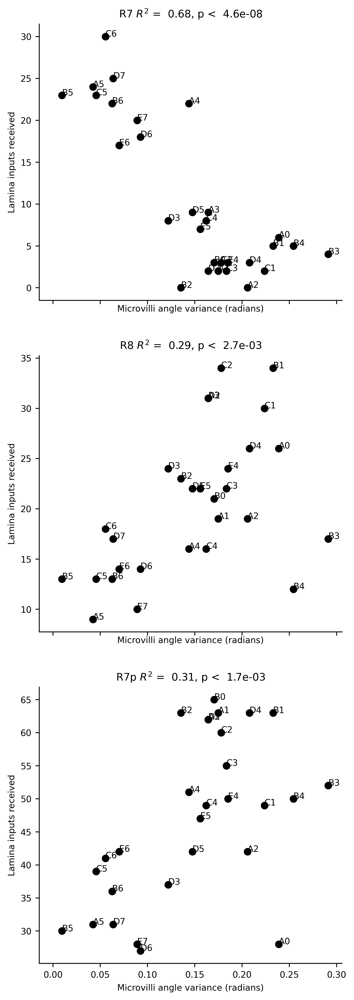

In [13]:
fig, ax = plt.subplots(3, figsize=[5, 8], sharex=True)
fig.subplots_adjust(top=2.0, bottom=0.5)
i = 0
for lpr, m in zip(["R7", "R8", "R7p"], ['o', 's', '^']):
    

    Y = widedf.filter(regex=f'->{lpr}$').sum(axis=1)
    _x = [] # PCA angle variance (across PR subtypes)

    for om in Y.index:
        _x.append(pca_angles.loc[(om, slice(None)), 'var'].mean())

    X = sm.add_constant(_x)

    model = sm.OLS(Y, X)
    results = model.fit()
    params = results.params
    display(params)
    # ~~~
    

    ax[i].scatter(x=_x, y=Y, c='k', marker='o')
    ax[i].set_title(f'{lpr} $R^{2}$ = {results.rsquared: .2f}, p < {results.f_pvalue: .1e}')
    ax[i].set_xlabel('Microvilli angle variance (radians)')
    ax[i].set_ylabel("Lamina inputs received")

    #xx = np.arange(min(_x), max(_x))
    xx = np.arange(0, max(_x))
    ax[i].plot(xx, params[0] + params[1] * xx, c='k', ls='--')
    
    for om_i, om in enumerate(Y.index):
        ax[i].annotate(om, (_x[om_i], Y[om]))
        

    # if save_figs:
    #     fig.savefig(fig_path + 'focal_rhabdom-diam_scatter' + '.svg')
    #     fig.savefig(fig_path + 'focal_rhabdom-diam_scatter' + '.png')

    # SHOW OLS RESULTS
    display(results.summary())
                  
    i += 1





Text(0, 0.5, "Lamina inputs difference - R7' & R7\n(contacts)")

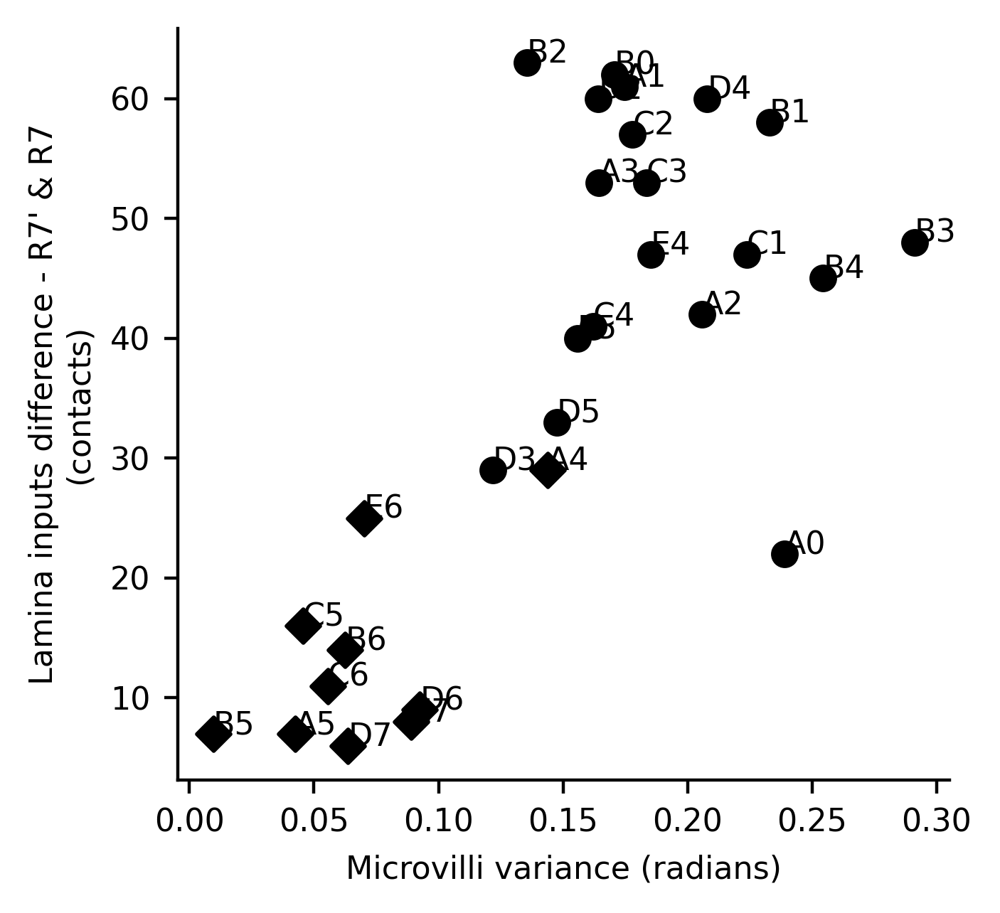

In [14]:
fig, ax = plt.subplots(1, figsize=[3.5, 3.5])
om_var = []
r7_r7p_del_angle = []

for om, v in pca_angles.groupby('om'):
    #print(v.index[, 1])
    cx_r7 = r7_inputs.loc[om] 
    cx_r7p = r7p_inputs.loc[om]
    cx_diff = np.abs(cx_r7p - cx_r7)
    
    if om in dra_om:
        m = 'D'
    else:
        m = 'o'

    
    x=v['var'].mean() 
    y=cx_diff
    ax.scatter(x=x, y=y, c='k', marker=m)
    ax.annotate(om, (x, y))
    
ax.set_xlabel('Microvilli variance (radians)')
ax.set_ylabel("Lamina inputs difference - R7' & R7\n(contacts)")

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.447
Model:                            OLS   Adj. R-squared:                  0.426
Method:                 Least Squares   F-statistic:                     21.80
Date:                Wed, 29 Jun 2022   Prob (F-statistic):           7.41e-05
Time:                        18:26:39   Log-Likelihood:                -129.98
No. Observations:                  29   AIC:                             264.0
Df Residuals:                      27   BIC:                             266.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         81.8424      9.167      8.928      0.000      63.033     100.652
0            -60.8652     13.035     -4.669      0.000     -87.611     -34.119
==============================================================================
Omnibus:                        7.434   Durbin-Watson:                   2.095
Prob(Omnibus):                  0.024   Jarque-Bera (JB):                2.315
Skew:                          -0.255   Prob(JB):                        0.314
Kurtosis:                       1.713   Cond. No.                         4.51
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

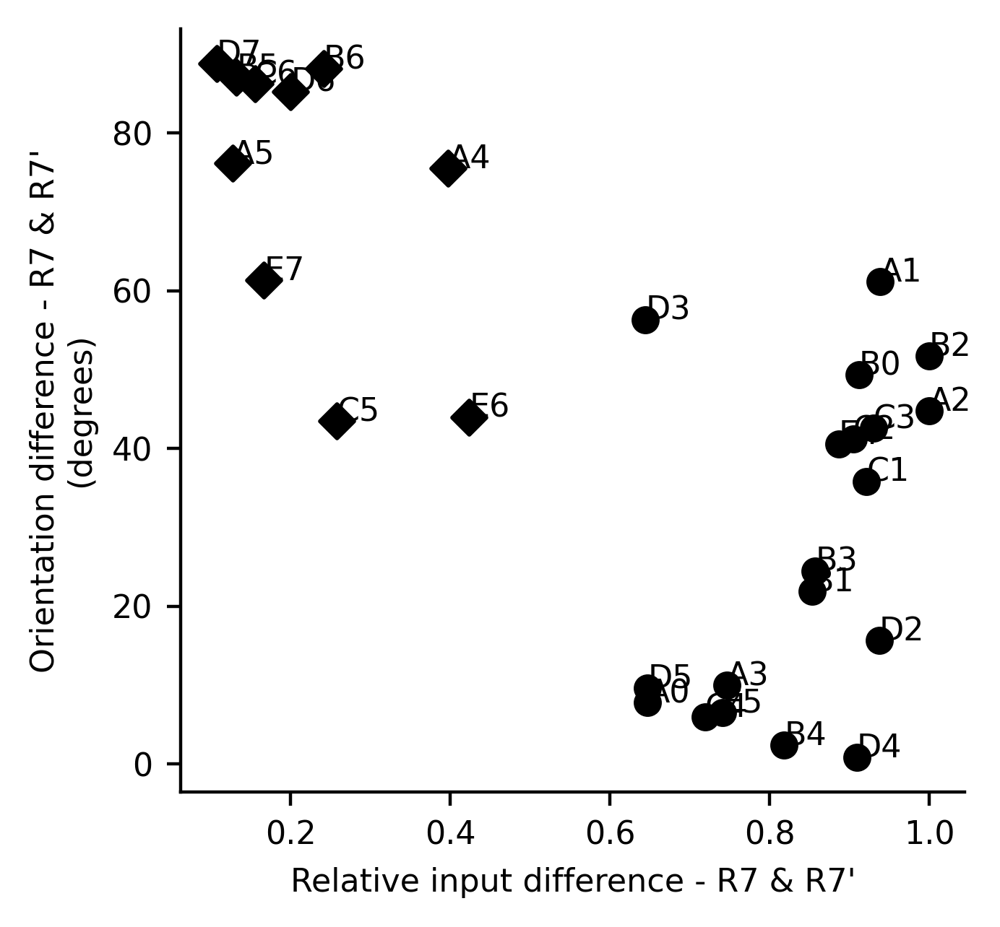

In [19]:
fig, ax = plt.subplots(1, figsize=[3.5, 3.5])
x_vals = []
y_vals = []

for om, v in pca_angles.groupby('om'):
    # microvilli orientation difference
    #print(v.index[, 1])
    r7_mv = v.loc[(om, 'R7'), 'wrapped'] 
    r7p_mv = v.loc[(om, "R7'"), 'wrapped'] 
    #mv_diff = np.degrees(np.abs(r7_mv - r7p_mv))
    mv_diff = np.degrees(angle_diff(r7_mv, r7p_mv))
    
    # Lamina inputs to R7 and R7'
    cx_diff = np.abs(r7_inputs.loc[om] - r7p_inputs.loc[om])
    rel_diff = cx_diff / (r7p_inputs.loc[om] + r7_inputs.loc[om])
    
    y = mv_diff
    x = rel_diff
    x_vals.append(x)
    y_vals.append(y)
    
    if om in dra_om:
        m = 'D'
    else:
        m = 'o'
    
    ax.scatter(x=x, y=y, c='k', marker=m)
    ax.annotate(om, (x, y))

# OLS
_x = pd.Series(x_vals)
X = sm.add_constant(_x)
Y = pd.Series(y_vals)

model = sm.OLS(Y, X)
results = model.fit()
params = results.params
display(results.summary())
    
    
ax.set_xlabel("Relative input difference - R7 & R7'")
ax.set_ylabel("Orientation difference - R7 & R7'\n(degrees)")

if save_figs:
    fig.savefig(fig_path + 'R7R7p_reldiff_degreesdiff_OMLABELS.png')
    fig.savefig(fig_path + 'R7R7p_reldiff_degreesdiff_OMLABELS.svg')

om  rt
A0  R7    0.631032
Name: var, dtype: float64

om  rt
A1  R7    0.430117
Name: var, dtype: float64

om  rt
A2  R7    0.613901
Name: var, dtype: float64

om  rt
A3  R7    0.155201
Name: var, dtype: float64

om  rt
A4  R7    0.095491
Name: var, dtype: float64

om  rt
A5  R7    0.048936
Name: var, dtype: float64

om  rt
B0  R7    0.003882
Name: var, dtype: float64

om  rt
B1  R7    0.454957
Name: var, dtype: float64

om  rt
B2  R7    0.008887
Name: var, dtype: float64

om  rt
B3  R7    0.426652
Name: var, dtype: float64

om  rt
B4  R7    0.457822
Name: var, dtype: float64

om  rt
B5  R7    0.013693
Name: var, dtype: float64

om  rt
B6  R7    0.009122
Name: var, dtype: float64

om  rt
C1  R7    0.439734
Name: var, dtype: float64

om  rt
C2  R7    0.067218
Name: var, dtype: float64

om  rt
C3  R7    0.022393
Name: var, dtype: float64

om  rt
C4  R7    0.253555
Name: var, dtype: float64

om  rt
C5  R7    0.010971
Name: var, dtype: float64

om  rt
C6  R7    0.000338
Name: var, dtype: float64

om  rt
D2  R7    0.46512
Name: var, dtype: float64

om  rt
D3  R7    0.023169
Name: var, dtype: float64

om  rt
D4  R7    0.213752
Name: var, dtype: float64

om  rt
D5  R7    0.197275
Name: var, dtype: float64

om  rt
D6  R7    0.016704
Name: var, dtype: float64

om  rt
D7  R7    0.002638
Name: var, dtype: float64

om  rt
E4  R7    0.44212
Name: var, dtype: float64

om  rt
E5  R7    0.190097
Name: var, dtype: float64

om  rt
E6  R7    0.013824
Name: var, dtype: float64

om  rt
E7  R7    0.154061
Name: var, dtype: float64

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.679
Model:                            OLS   Adj. R-squared:                  0.667
Method:                 Least Squares   F-statistic:                     57.19
Date:                Wed, 29 Jun 2022   Prob (F-statistic):           3.91e-08
Time:                        18:11:00   Log-Likelihood:                -65.000
No. Observations:                  29   AIC:                             134.0
Df Residuals:                      27   BIC:                             136.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.8508      0.975      1.898      0.068      -0.150       3.852
0             10.4861      1.387      7.562      0.000       7.641      13.331
==============================================================================
Omnibus:                        4.998   Durbin-Watson:                   2.268
Prob(Omnibus):                  0.082   Jarque-Bera (JB):                3.412
Skew:                           0.792   Prob(JB):                        0.182
Kurtosis:                       3.563   Cond. No.                         4.51
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

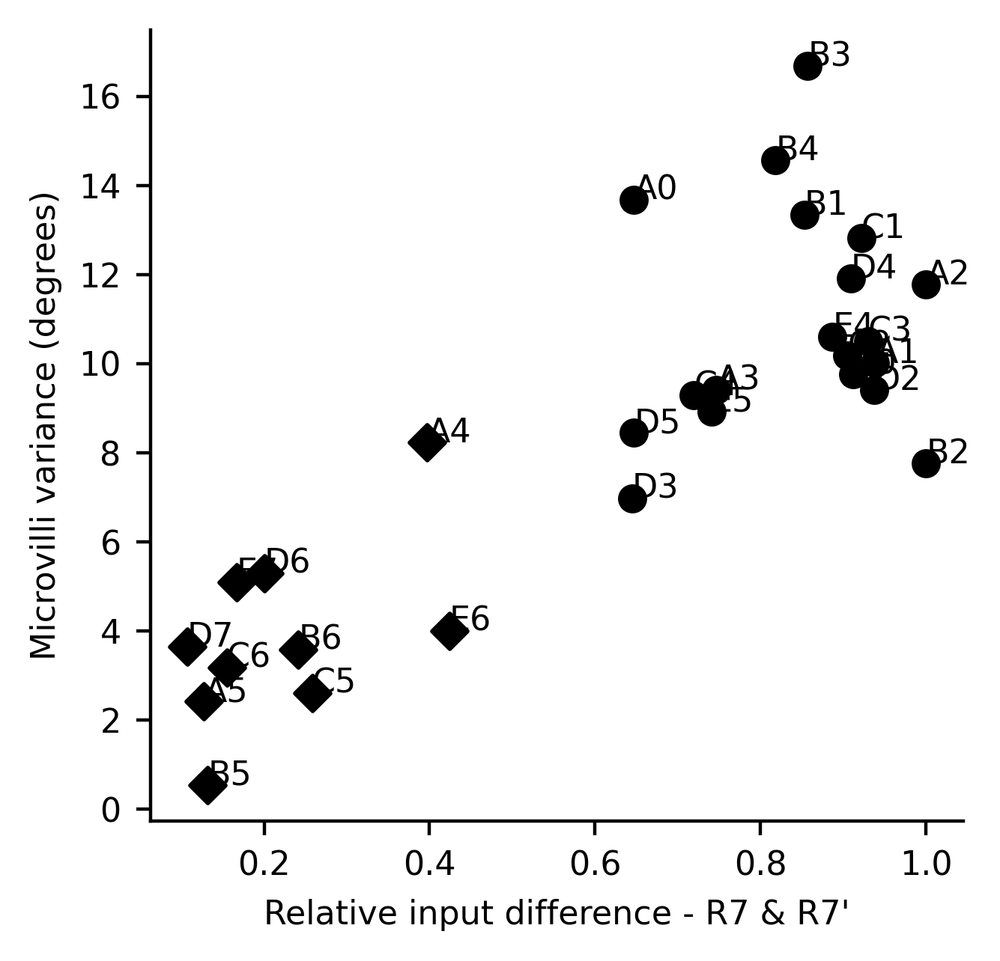

In [18]:
import statsmodels.api as sm
fig, ax = plt.subplots(1, figsize=[3.5, 3.5])

x_vals = []
y_vals = []

for om, v in pca_angles.groupby('om'):
    #print(v.index[, 1])
    display(v.loc[(slice(None), ['R7', 'R7p']), 'var'])
    #mv_var = np.degrees(v.loc[(slice(None), ['R7', 'R7p']), 'var'].mean())
    mv_var = np.degrees(v['var'].mean())
    
    cx_diff = np.abs(r7_inputs.loc[om] - r7p_inputs.loc[om])
    rel_diff = cx_diff / (r7p_inputs.loc[om] + r7_inputs.loc[om])
    x = rel_diff
    y = mv_var
    
    x_vals.append(x)
    y_vals.append(y)
    
    
    if om in dra_om:
        m = 'D'
    else:
        m = 'o'
    
    ax.scatter(x=x, y=y, c='k', marker=m)
    ax.annotate(om, (x, y))
    
_x = pd.Series(x_vals)
X = sm.add_constant(_x)
Y = pd.Series(y_vals)

model = sm.OLS(Y, X)
results = model.fit()
params = results.params
display(results.summary())
    
    
ax.set_xlabel("Relative input difference - R7 & R7'")
ax.set_ylabel("Microvilli variance (degrees)")

#ax.set_title("Variance = mean var of all PR")

if save_figs:
    fig.savefig(fig_path + 'R7R7p_reldiff_var_OMLABELS.png')
    fig.savefig(fig_path + 'R7R7p_reldiff_var_OMLABELS.svg')

In [17]:
def circular_hist(ax, x, bins=32, density=True, offset=0, gaps=True, 
                  color='k', facecolor=None):
    """
    Produce a circular histogram of angles on ax.
    From Stackoverflow user: jwalton
    Parameters
    ----------
    ax : matplotlib.axes._subplots.PolarAxesSubplot
        axis instance created with subplot_kw=dict(projection='polar').

    x : array
        Angles to plot, expected in units of radians.

    bins : int, optional
        Defines the number of equal-width bins in the range. The default is 16.

    density : bool, optional
        If True plot frequency proportional to area. If False plot frequency
        proportional to radius. The default is True.

    offset : float, optional
        Sets the offset for the location of the 0 direction in units of
        radians. The default is 0.

    gaps : bool, optional
        Whether to allow gaps between bins. When gaps = False the bins are
        forced to partition the entire [-pi, pi] range. The default is True.

    Returns
    -------
    n : array or list of arrays
        The number of values in each bin.

    bins : array
        The edges of the bins.

    patches : `.BarContainer` or list of a single `.Polygon`
        Container of individual artists used to create the histogram
        or list of such containers if there are multiple input datasets.
    """
    # Wrap angles to [-pi, pi)
    x = (x+np.pi) % (2*np.pi) - np.pi

    # Force bins to partition entire circle
    if not gaps:
        bins = np.linspace(-np.pi, np.pi, num=bins+1)

    # Bin data and record counts
    n, bins = np.histogram(x, bins=bins)

    # Compute width of each bin
    widths = np.diff(bins)

    # By default plot frequency proportional to area
    if density:
        # Area to assign each bin
        area = n / x.size
        # Calculate corresponding bin radius
        radius = (area/np.pi) ** .5
    # Otherwise plot frequency proportional to radius
    else:
        radius = n

    # Plot data on ax
    if facecolor is None:
        patches = ax.bar(bins[:-1], radius, zorder=1, align='edge', width=widths,
                     edgecolor=color, fill=False, linewidth=1)
    else:
        patches = ax.bar(bins[:-1], radius, zorder=1, align='edge', width=widths,
                         edgecolor=color, facecolor=facecolor, linewidth=1)

    # Set the direction of the zero angle
    ax.set_theta_offset(offset)

    # Remove ylabels for area plots (they are mostly obstructive)
    if density:
        ax.set_yticks([])

    return n, bins, patches

### Visualize mean angles of PR types

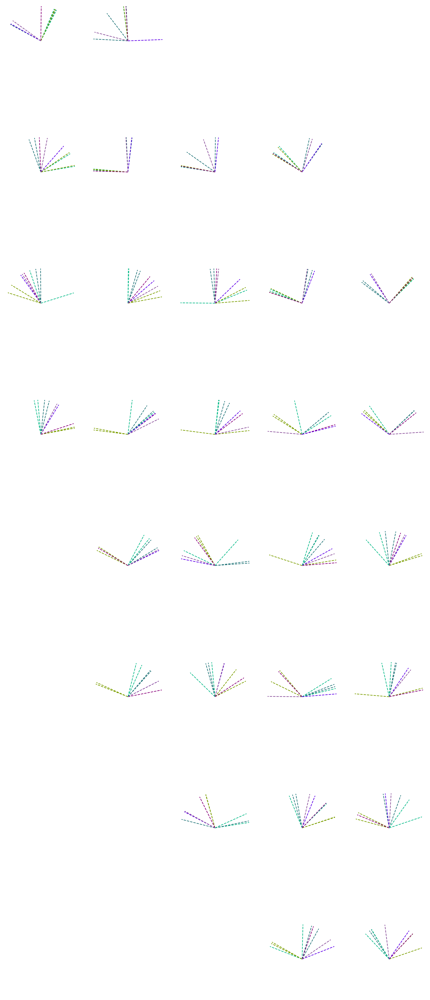

In [19]:
fig, axes = plt.subplots(8, 5, figsize=[12, 30], subplot_kw={'projection': 'polar'}, sharey=True)

f_i = 0
for om, v in twist_df.groupby('om'):
    row, col = om_subplot_position(om)
    ax = axes[col, row]
    
    for rt, vv in v.groupby('subtype'):
        
        c = st_cm[rt]
        mn_angle = pca_angles.loc[(om, rt), 'wrapped']
        ax.plot([0, mn_angle], [0, 0.2], lw=1, ls='--', c=c)
        #ax.plot([0, mn_angle + np.pi], [0, 0.2], lw=1, ls='--', c=c)
    
for ax in axes.flatten():
    ax.axis('off')
    

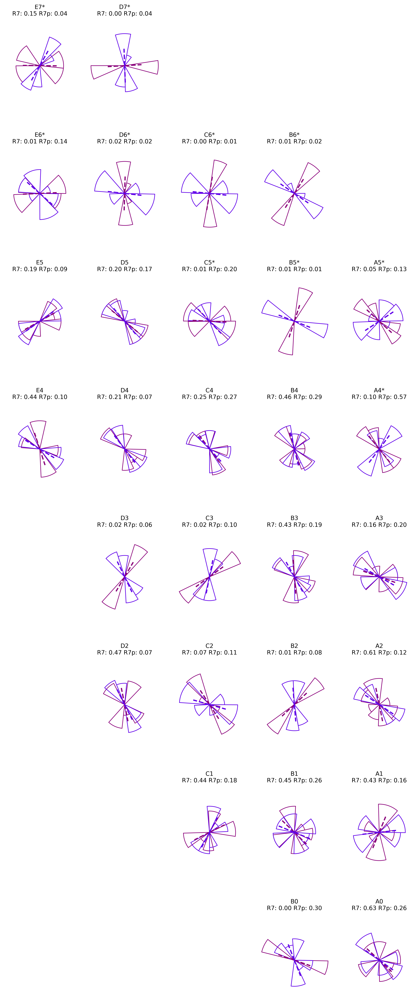

In [20]:
fig, axes = plt.subplots(8, 5, figsize=[12, 30], subplot_kw={'projection': 'polar'}, sharey=True)

f_i = 0
for om, v in twist_df.groupby('om'):
    row, col = om_subplot_position(om)
    ax = axes[col, row]

    for rt, vv in v.groupby('subtype'):
        if rt not in ['R7', "R7'"]:#, "R8"]:
            continue
            
        c = st_cm[rt]
        mn_angle = pca_angles.loc[(om, rt), 'wrapped']
        ax.plot([0, mn_angle + np.pi/2.0], [0, 0.2], lw=2, ls='--', c=c)
        ax.plot([0, mn_angle + np.pi + np.pi/2.0], [0, 0.2], lw=2, ls='--', c=c)
        
        x = np.array([vv['conv-angle'], vv['conv-angle'] + np.pi]).flatten()
        n, bins, patches = circular_hist(ax=ax, x=x, color=c, bins=8)
        
    r7_var = pca_angles.loc[(om, "R7"), 'var']
    r7p_var = pca_angles.loc[(om, "R7'"), 'var']    
    
    if om in dra_om:
        ax.set_title(om + '*' + f"\nR7:{r7_var: .2f} R7p:{r7p_var: .2f}") 
    else: 
        ax.set_title(om + f"\nR7:{r7_var: .2f} R7p:{r7p_var: .2f}")
    


for ax in axes.flatten():
    ax.axis('off')


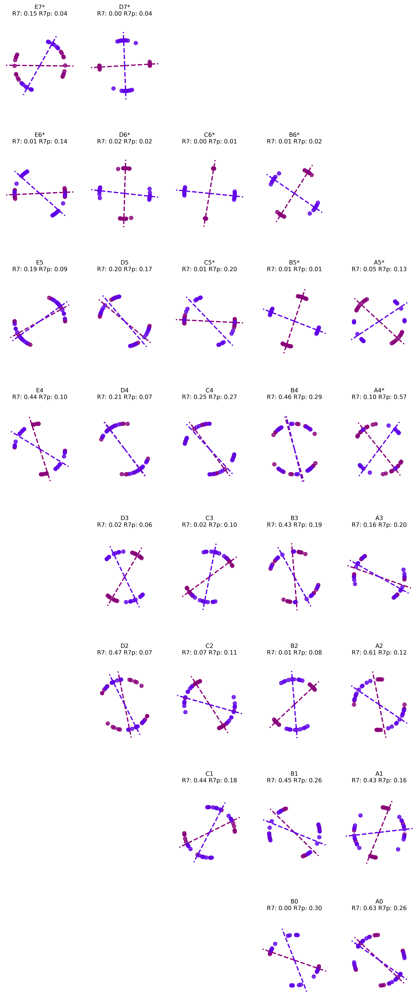

In [21]:
fig, axes = plt.subplots(8, 5, figsize=[12, 30], subplot_kw={'projection': 'polar'})

f_i = 0
for om, v in twist_df.groupby('om'):
    row, col = om_subplot_position(om)
    ax = axes[col, row]
    
    means = []
    medians = []
    for rt, vv in v.groupby('subtype'):
        if rt not in ['R7', "R7'"]:#, "R8"]:
            continue
            
        c = st_cm[rt]
        mn_angle = pca_angles.loc[(om, rt), 'wrapped']
       # ax.plot([0, mn_angle], [0, 20], lw=2, ls='--', c=c)
        #ax.plot([0, mn_angle + np.pi], [0, 20], lw=2, ls='--', c=c)
        ax.plot([0, mn_angle + np.pi/2.0], [0, 20], lw=2, ls='--', c=c)
        ax.plot([0, mn_angle - np.pi/2.0], [0, 20], lw=2, ls='--', c=c)
        z=0
        
        
        for i, vvv in vv['conv-angle'].items():
            radius = 15.0 #- (z * 1.0)
            #ax.plot([np.pi + vvv, 0, vvv], [radius, 0, radius], c=c)
            z += 1.0
            ax.scatter(vvv, radius, c=c, label=rt, alpha=0.8)
            ax.scatter(vvv + np.pi, radius, c=c, alpha=0.8)
    r7_var = pca_angles.loc[(om, "R7"), 'var']
    r7p_var = pca_angles.loc[(om, "R7'"), 'var']    
    if om in dra_om:
        
        ax.set_title(om + '*' + f"\nR7:{r7_var: .2f} R7p:{r7p_var: .2f}") #+ f"\n$\Delta$ median ={abs(medians[0] - medians[1]): .2f}" 
                    #+ f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    else: 
        ax.set_title(om + f"\nR7:{r7_var: .2f} R7p:{r7p_var: .2f}") #+ f"\n$\Delta$ median={abs(medians[0] - medians[1]): .2f}"
                     #+ f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    

#axes[0, 1].legend()

for ax in axes.flatten():
    ax.axis('off')
#fig.delaxes(axes[-1])
if save_figs:
    fig.savefig(fig_path + "microvil-points.png")
    fig.savefig(fig_path + "microvil-points.svg")

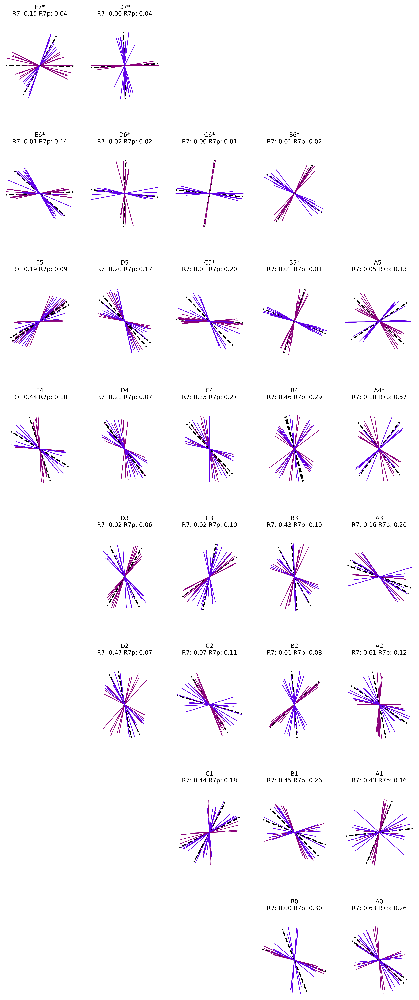

In [22]:
fig, axes = plt.subplots(8, 5, figsize=[12, 30], subplot_kw={'projection': 'polar'})

f_i = 0
for om, v in twist_df.groupby('om'):
    row, col = om_subplot_position(om)
    ax = axes[col, row]
    
    means = []
    medians = []
    for rt, vv in v.groupby('subtype'):
        if rt not in ['R7', "R7'"]:#, "R8"]:
            continue
            
        c = st_cm[rt]
        mn_angle = pca_angles.loc[(om, rt), 'wrapped']
       # ax.plot([0, mn_angle], [0, 20], lw=2, ls='--', c=c)
        #ax.plot([0, mn_angle + np.pi], [0, 20], lw=2, ls='--', c=c)
        ax.plot([0, mn_angle + np.pi/2.0], [0, 25], lw=2, ls='--', c='k')
        ax.plot([0, mn_angle - np.pi/2.0], [0, 25], lw=2, ls='--', c='k')
        z=0
        
        
        for i, vvv in vv['conv-angle'].items():
            radius = 15.0 #- (z * 1.0)
            #ax.plot([np.pi + vvv, 0, vvv], [radius, 0, radius], c=c)
            z += 1.0
            ax.plot([0, vvv + np.pi], [0, radius + z], lw=1, c=c)
            ax.plot([0, vvv], [0, radius+z], lw=1, c=c)
    r7_var = pca_angles.loc[(om, "R7"), 'var']
    r7p_var = pca_angles.loc[(om, "R7'"), 'var']    
    if om in dra_om:
        
        ax.set_title(om + '*' + f"\nR7:{r7_var: .2f} R7p:{r7p_var: .2f}") #+ f"\n$\Delta$ median ={abs(medians[0] - medians[1]): .2f}" 
                    #+ f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    else: 
        ax.set_title(om + f"\nR7:{r7_var: .2f} R7p:{r7p_var: .2f}") #+ f"\n$\Delta$ median={abs(medians[0] - medians[1]): .2f}"
                     #+ f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    

#axes[0, 1].legend()

for ax in axes.flatten():
    ax.axis('off')
    
if save_figs:
    fig.savefig(fig_path + "microvil-sticks.png")
    fig.savefig(fig_path + "microvil-sticks.svg")
#fig.delaxes(axes[-1])

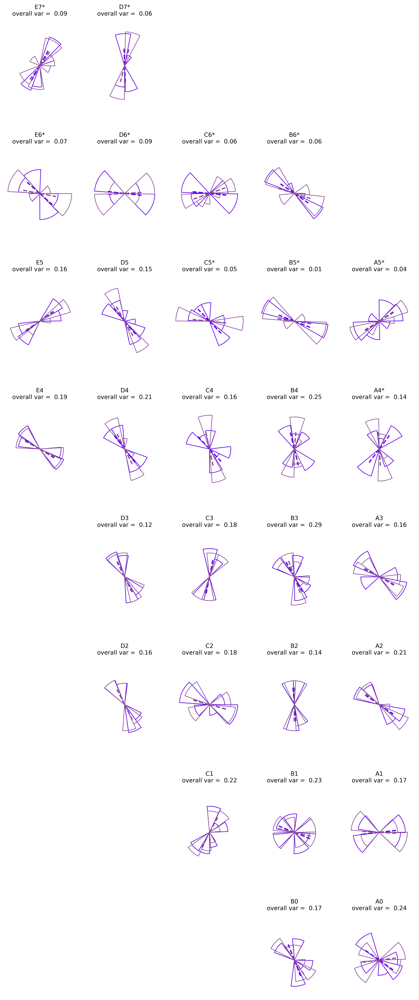

In [71]:
fig, axes = plt.subplots(8, 5, figsize=[12, 30], subplot_kw={'projection': 'polar'}, sharey=True)

f_i = 0
for om, v in twist_df.groupby('om'):
    row, col = om_subplot_position(om)
    ax = axes[col, row]

    for rt, vv in v.groupby('subtype'):
        if rt not in ['R8', "R7'"]:#, "R8"]:
            continue
            
        c = st_cm[rt]
        mn_angle = pca_angles.loc[(om, rt), 'wrapped']
        ax.plot([0, mn_angle + np.pi/2.0], [0, 0.2], lw=2, ls='--', c=c)
        ax.plot([0, mn_angle + np.pi + np.pi/2.0], [0, 0.2], lw=2, ls='--', c=c)
        
        x = np.array([vv['conv-angle'], vv['conv-angle'] + np.pi]).flatten()
        if rt == 'R7':
            n, bins, patches = circular_hist(ax=ax, x=x, color=c, bins=8)
        else:
            n, bins, patches = circular_hist(ax=ax, x=x, color=c, bins=8)
        
#     r7_var = pca_angles.loc[(om, "R7"), 'var']
#     r7p_var = pca_angles.loc[(om, "R7'"), 'var']    
    
    overall_var = pca_angles.loc[(om, slice(None)), 'var'].mean()
    if om in dra_om:
        ax.set_title(om + '*' + f'\noverall var = {overall_var: .2f}') 
    else: 
        ax.set_title(om + f'\noverall var = {overall_var: .2f}')
    


for ax in axes.flatten():
    ax.axis('off')


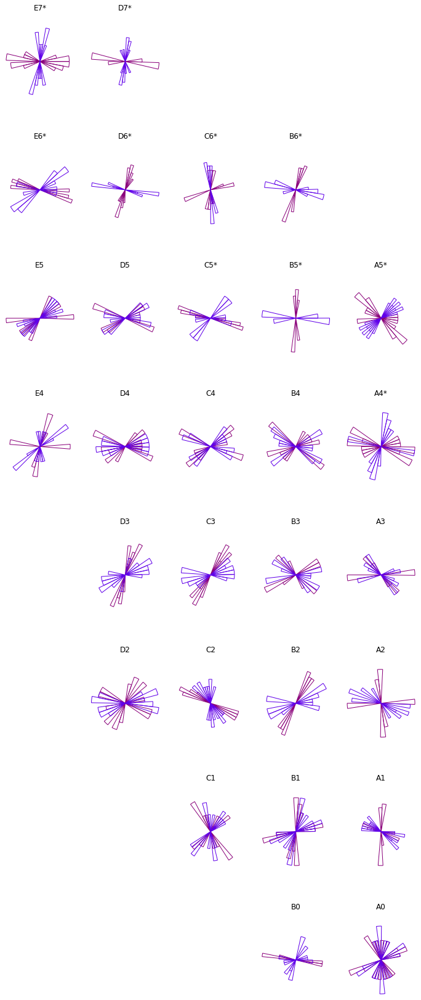

In [49]:
fig, axes = plt.subplots(8, 5, figsize=[12, 30], subplot_kw={'projection': 'polar'})

f_i = 0
for om, v in twist_df.groupby('om'):
    row, col = om_subplot_position(om)
    ax = axes[col, row]
    
    means = []
    medians = []
    for rt, vv in v.groupby('subtype'):
        if rt not in ['R7', "R7'"]:#, "R8"]:
            continue
            
        c = st_cm[rt]
        x = np.array([[a, a + np.pi] for a in vv['conv-angle'].dropna()]).flatten()
        circular_hist(ax=ax, x=x, color=c)
        #circular_hist(ax=ax, x=vv['conv-angle'].dropna(), color=c)
        z=0
        
        
#         for i, vvv in vv['conv-angle'].items():
#             radius = 15.0 #- (z * 1.0)
#             #ax.plot([np.pi + vvv, 0, vvv], [radius, 0, radius], c=c)
#             z += 1.0
#             ax.scatter(vvv, radius, c=c, label=rt)
#             ax.scatter(vvv + np.pi, radius, c=c)
        
    if om in dra_om:
        ax.set_title(om + '*') #+ f"\n$\Delta$ median ={abs(medians[0] - medians[1]): .2f}" 
                    #+ f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    else: 
        ax.set_title(om) #+ f"\n$\Delta$ median={abs(medians[0] - medians[1]): .2f}"
                     #+ f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    

#axes[0, 1].legend()

for ax in axes.flatten():
    ax.axis('off')
#fig.delaxes(axes[-1])

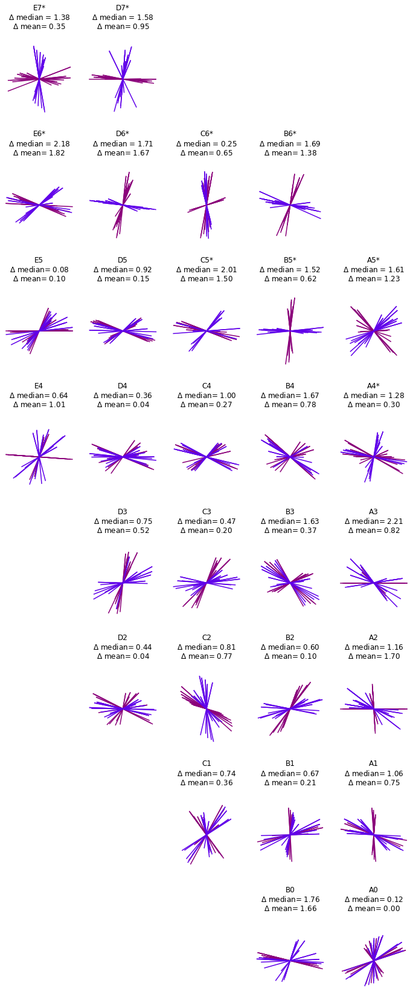

In [79]:
fig, axes = plt.subplots(8, 5, figsize=[12, 30], subplot_kw={'projection': 'polar'})

f_i = 0
for om, v in twist_df.groupby('om'):
    row, col = om_subplot_position(om)
    ax = axes[col, row]
    
    means = []
    medians = []
    for rt, vv in v.groupby('subtype'):
        if rt not in ['R7', "R7'"]:#, "R8"]:
            continue
            
        c = st_cm[rt]
        
        mn = vv['conv-angle'].mean()
        md = vv['conv-angle'].median()
        #ax.plot([np.pi + md, 0], [16, 0], lw=2, ls='--', c=c)
        
        medians.append(md)
        means.append(mn)
        #ax.plot([np.pi + mn_angle, 0, md_angle], [16, 0, 16], lw=2, ls='--', c=c)
        z=0
        
        
        for i, vvv in vv['conv-angle'].items():
            radius = 15.0 - (z * 1.0)
            ax.plot([np.pi + vvv, 0, vvv], [radius, 0, radius], c=c)
            z += 1.0
            ax.plot([0, vvv], [0, radius], c=c, label=rt)
        
    if om in dra_om:
        ax.set_title(om + '*' + f"\n$\Delta$ median ={abs(medians[0] - medians[1]): .2f}" 
                    + f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    else: 
        ax.set_title(om + f"\n$\Delta$ median={abs(medians[0] - medians[1]): .2f}"
                     + f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    

#axes[0, 1].legend()

for ax in axes.flatten():
    ax.axis('off')
#fig.delaxes(axes[-1])

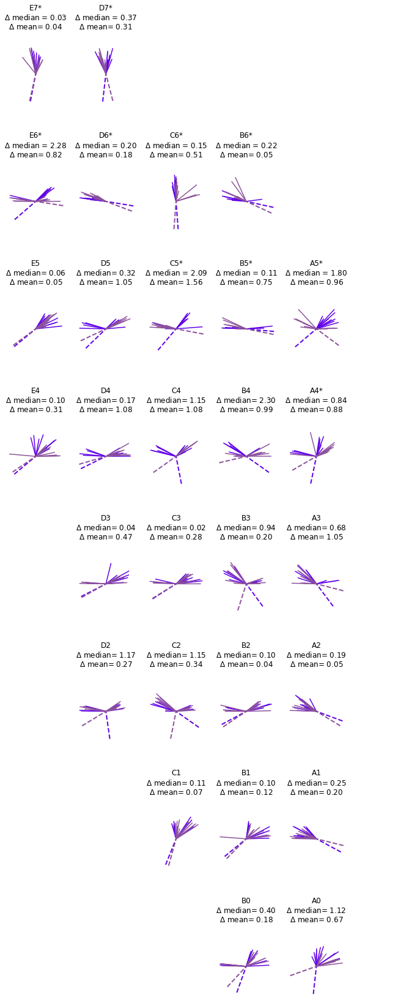

In [20]:
fig, axes = plt.subplots(8, 6, figsize=[12, 30], subplot_kw={'projection': 'polar'})

# rt_radius = {'R7': 0.9, 
#              "R7'": 1.0}

#axes = ax.flatten()
f_i = 0
for om, v in twist_df.groupby('om'):
    row, col = om_subplot_position(om)
    ax = axes[col, row]
    
    means = []
    medians = []
    for rt, vv in v.groupby('subtype'):
        if rt not in ['R8', "R7'"]:#, "R8"]:
            continue
            
        c = st_cm[rt]
        
        mn = vv['conv-angle'].mean()
        md = vv['conv-angle'].median()
        ax.plot([np.pi + md, 0], [16, 0], lw=2, ls='--', c=c)
        
        medians.append(md)
        means.append(mn)
        #ax.plot([np.pi + mn_angle, 0, md_angle], [16, 0, 16], lw=2, ls='--', c=c)
        z=0

        for i, vvv in vv['conv-angle'].items():
            radius = 15.0 - (z * 1.0)
            #ax.plot([np.pi + vvv, 0, vvv], [radius, 0, radius], c=c)
            z += 1.0
            ax.plot([0, vvv], [0, radius], c=c, label=rt)
        
    if om in dra_om:
        ax.set_title(om + '*' + f"\n$\Delta$ median ={abs(medians[0] - medians[1]): .2f}" 
                    + f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    else: 
        ax.set_title(om + f"\n$\Delta$ median={abs(medians[0] - medians[1]): .2f}"
                     + f"\n$\Delta$ mean={abs(means[0] - means[1]): .2f}")
    

#axes[0, 0].legend()

for ax in axes.flatten():
    ax.axis('off')
#fig.delaxes(axes[-1])

In [ ]:
all_om = sorted(twist_df['om'].unique())
dra_om = ['A4', 'A5', 'B5', 'B6', 'C5', 'C6', 'D6', 'D7', 'E6', 'E7']  # as defined by connectivity clustering
ndra_om = [str(o) for o in all_om if o not in dra_om]
subtypes = sorted(twist_df['subtype'].unique())

## Compute angular differences between measurements
- Data is collected on ImageJ, which records the smaller (< 180) angle between two lines drawn by the user
- Anastasia added a negative sign to angles measured clockwise from the reference angle
- Because of this, we cannot use angle1 - angle2 as the difference
- First, the angle1 - angle2 differences are converted into minimal positive (counter-clockwise) angles by taking % 360 , "_diff"
- Secondly, for counter clockwise angles more than +180, we take the smaller angle in the CCW direction by subtracting 360, "diff". This retains the sign convention of negative -> CW twist 

In [ ]:


for i, om_rows in twist_df.groupby('om'):
    for ii, rows in om_rows.groupby('subtype'):
        n = 0
        for iii, row in rows.sort_values('z-index').iterrows():
            twist_df.loc[iii, 'n'] = int(n)
            if n == 0:  # first measurement has diff of 0
                twist_df.loc[iii, '_diff'] = np.nan
                twist_df.loc[iii, 'diff'] = np.nan
                twist_df.loc[iii, 'cumulative'] = 0.0
                twist_df.loc[iii, '_angle'] = twist_df.loc[iii, 'angle']
                twist_df.loc[iii, 'interval_len'] = np.nan # 0.0
                twist_df.loc[iii, 'interval_z'] = np.nan
                previous = (iii, twist_df.loc[iii, 'angle'])
            elif math.isnan(twist_df.loc[iii, 'angle']):
                #print(f"NaN found for {i}_{ii} measurement: {n}")
                twist_df.loc[iii, '_diff'] = np.nan
                twist_df.loc[iii, 'diff'] = np.nan
                twist_df.loc[iii, 'cumulative'] = np.nan
                twist_df.loc[iii, '_angle'] = np.nan
                twist_df.loc[iii, 'interval_len'] = np.nan
                twist_df.loc[iii, 'interval_z'] = np.nan
                # previous = measurement before the NaN, though n still increases by 1
            else:
                twist_df.loc[iii, '_diff'] = (twist_df.loc[iii, 'angle'] - previous[1]) % 360.0
                twist_df.loc[iii, 'diff'] = twist_df.loc[iii, '_diff'] - 360.0 * (twist_df.loc[iii, '_diff'] > 180.0)
                twist_df.loc[iii, 'cumulative'] = twist_df.loc[previous[0], 'cumulative'] + twist_df.loc[iii, 'diff']
                twist_df.loc[iii, '_angle'] = twist_df.loc[previous[0], '_angle'] + twist_df.loc[iii, 'diff']
                twist_df.loc[iii, 'interval_len'] = (twist_df.loc[iii, 'z-index'] - twist_df.loc[previous[0], 'z-index']) * 8.0 / 1000.0
                twist_df.loc[iii, 'interval_z'] = twist_df.loc[iii, 'z-index'] - twist_df.loc[previous[0], 'z-index']
                # because 1 px = 8/1000 microns
                previous = (iii, twist_df.loc[iii, 'angle'])
            n += 1
twist_df['diff_per_micron'] = twist_df['diff'] / twist_df['interval_len']
#twist_df['_angle'] = twist_df['_angle'] % 180.0
            
#twist_df['diff'] = twist_df['_diff'] - 360*(twist_df['_diff']>180)

# display(twist_df.loc[(twist_df['om']=='A0') & (twist_df['subtype'] == 'R5'), 
#                     ('om', 'subtype', 'z-index', 'angle', '_diff', 'diff', 'cumulative')].sort_values('z-index'))

# Example D6_R1 shows how NaNs are used 
display(twist_df.loc[(twist_df['om']=='D6') & (twist_df['subtype'] == 'R1'), :].sort_values('z-index'))
display(twist_df.loc[(twist_df['om']=='A4') & (twist_df['subtype'] == 'R8'), :].sort_values('z-index'))
display(twist_df.loc[(twist_df['om']=='B1') & (twist_df['subtype'] == 'R7'), :].sort_values('z-index'))

display(twist_df.loc[:, 'cumulative'].max())
display(twist_df.loc[:, 'diff'].max())

## 

In [6]:
#twist_df['cosine'] = np.cos(twist_df['angle']*(np.pi/180.0))
twist_df['cosine_sq'] = np.cos(twist_df['angle']*(np.pi/180.0)) ** 2
twist_df['CCW_angle'] = [(360.0 + x) if x < 0 else x for x in twist_df['angle']]

In [7]:
# fig, ax = plt.subplots(15, 2, figsize=[25, 80], sharey=True)
# axes = ax.flatten()
# i = 0
# for om, rows in twist_df.groupby('om'):
    
#     #display(rows)
#     sns.lineplot(x='z-index', y='cosine_sq', hue='subtype', data=rows, markers=True, ax=axes[i])
#     axes[i].set_title(f"Ommatidium: {om}")
#     i += 1
    
# axes[-1].remove()
# #fig.savefig("/mnt/home/nchua/Dropbox/200902_microvilli_raw_all.pdf", bbox_inches='tight')

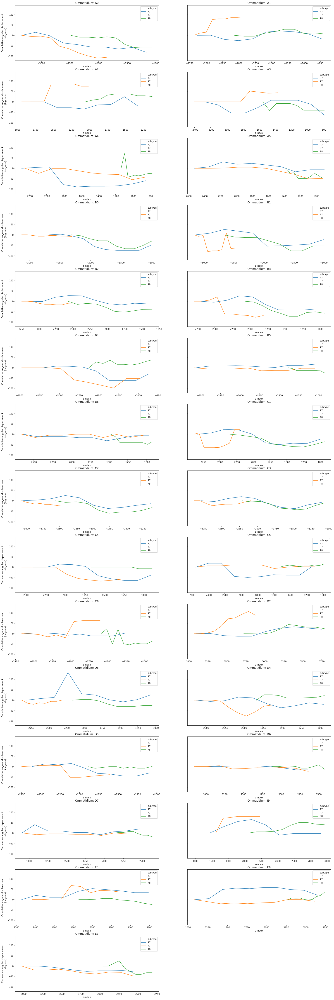

In [8]:
fig, ax = plt.subplots(15, 2, figsize=[25, 80], sharey=True)
axes = ax.flatten()
i = 0
for om, rows in twist_df.groupby('om'):
    rows = rows.loc[[i for i, v in rows['subtype'].items() if int(v[1]) > 6]] 
    #display(rows)
    sns.lineplot(x='z-index', y='cumulative', hue='subtype', data=rows, markers=True, ax=axes[i])
    axes[i].set_title(f"Ommatidium: {om}")
    axes[i].set_ylabel("Cumulative angular displacement\n(degrees)")
    i += 1
    
axes[-1].remove()
#fig.savefig("/mnt/home/nchua/Dropbox/200902_microvilli_raw_lvf.pdf", bbox_inches='tight')

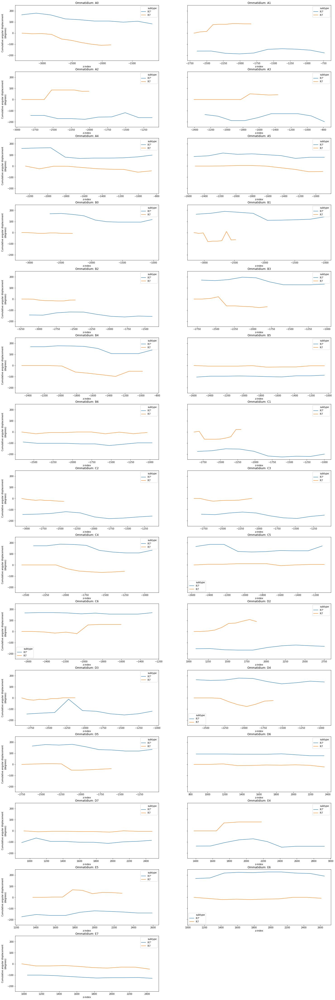

In [9]:
fig, ax = plt.subplots(15, 2, figsize=[25, 80], sharey=True)
axes = ax.flatten()
i = 0
for om, rows in twist_df.groupby('om'):
    rows = rows.loc[[i for i, v in rows['subtype'].items() if int(v[1]) == 7]] 
    #display(rows)
    sns.lineplot(x='z-index', y='_angle', hue='subtype', data=rows, markers=True, ax=axes[i])
    #sns.lineplot(x='z-index', y=)
    axes[i].set_title(f"Ommatidium: {om}")
    axes[i].set_ylabel("Cumulative angular displacement\n(degrees)")
    i += 1
    
axes[-1].remove()
#fig.savefig("/mnt/home/nchua/Dropbox/200902_microvilli_raw_lvf.pdf", bbox_inches='tight')

In [10]:
abs_diff = twist_df.copy()
#abs_diff['diff'] = np.abs(abs_diff['diff'])
abs_diff['abs_diff_per_micron'] = np.abs(abs_diff['diff_per_micron'])
abs_diff['previous_z'] = abs_diff['z-index'] - abs_diff['interval_z']

display(abs_diff['abs_diff_per_micron'].median())

5.2721088435374055

In [11]:
abs_diff.sort_values('abs_diff_per_micron', ascending=False).loc[abs_diff['subtype']=='R7', 
                    ['om', 'subtype','previous_z', 'z-index', 'diff', 'diff_per_micron']].head(20)

,om,subtype,previous_z,z-index,diff,diff_per_micron
2336,B1,R7,-2706.0,-2629.0,81.9,132.954545
2332,B1,R7,-3014.0,-2937.0,-77.8,-126.298701
2337,B1,R7,-2629.0,-2552.0,-75.6,-122.727273
2241,C1,R7,-2805.0,-2729.0,-70.9,-116.611842
2247,C1,R7,-2349.0,-2273.0,65.4,107.565789
165,A2,R7,-2623.0,-2520.0,86.5,104.975728
344,E4,R7,1646.0,1735.0,71.2,100.000000
1334,B3,R7,-2464.0,-2354.0,-82.5,-93.750000
1156,C6,R7,-2074.0,-1956.0,77.9,82.521186
2422,A1,R7,-2499.0,-2404.0,61.2,80.526316


In [12]:
abs_diff.sort_values('abs_diff_per_micron', ascending=False).loc[abs_diff['subtype']=="R7'", 
                    ['om', 'subtype','previous_z', 'z-index', 'diff', 'diff_per_micron']].head(20)

,om,subtype,previous_z,z-index,diff,diff_per_micron
1473,D3,R7',-2416.0,-2223.0,119.9,77.655440
1474,D3,R7',-2223.0,-2030.0,-102.6,-66.450777
2472,A4,R7',-1966.0,-1806.0,-84.8,-66.250000
1926,C5,R7',-2234.0,-2075.0,-63.9,-50.235849
210,A3,R7',-951.0,-786.0,-52.1,-39.469697
306,E4,R7',2251.0,2420.0,-50.1,-37.056213
1206,B4,R7',-1533.0,-1366.0,-46.0,-34.431138
1932,C5,R7',-1280.0,-1121.0,43.5,34.198113
34,C4,R7',-1736.0,-1570.0,-45.3,-34.111446
2294,B1,R7',-2188.0,-1952.0,-62.9,-33.315678


,om,subtype,z-index,angle,n,_diff,diff,cumulative,_angle,interval_len,interval_z,diff_per_micron,cosine_sq,CCW_angle
2521,A4,R8,-1054.0,-67.4,2.0,246.6,-113.4,-42.4,-67.4,0.32,40.0,-354.375,0.147683,292.6


Text(0,0.5,'Frequency observed')

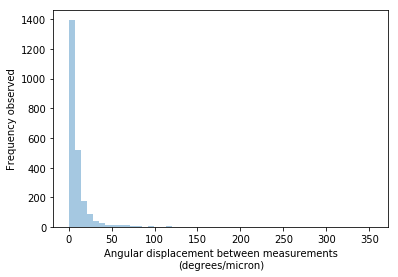

In [13]:
display(twist_df.loc[twist_df['diff_per_micron'].abs() == twist_df['diff_per_micron'].abs().max()])

fig, ax = plt.subplots(1)
ax = sns.distplot(twist_df['diff_per_micron'].abs().dropna(), kde=False)
ax.set_xlabel('Angular displacement between measurements\n(degrees/micron)')
ax.set_ylabel('Frequency observed')

In [14]:
# fig, ax = plt.subplots(15, 2, figsize=[25, 80], sharey=True)
# axes = ax.flatten()
# i = 0
# for om, rows in twist_df.groupby('om'):
#     rows = rows.loc[[i for i, v in rows['subtype'].items() if int(v[1]) < 7]] 
#     #display(rows)
#     sns.lineplot(x='z-index', y='cosine_sq', hue='subtype', data=rows, markers=True, ax=axes[i])
#     axes[i].set_title(f"Ommatidium: {om}")
#     i += 1
    
# axes[-1].remove()
# #fig.savefig("/mnt/home/nchua/Dropbox/200902_microvilli_raw_svf.pdf", bbox_inches='tight')

In [56]:
cols = pd.MultiIndex.from_product([['mean_diff', 'mean_diff_per_micron', 'SD_diff', 'mean_cosine_sq', 'r_mean_cosine_sq', 'SD_cosine_sq', 'max_displacement', 'SD_displacement', 'length', 'n_measure'], subtypes], names=['measure', 'subtype'])
twist_results = pd.DataFrame(columns = cols, index=all_om)

rh_length = pd.Series(index=all_om, dtype=float)

display(twist_df.loc[[bool([twist_df['om'] == 'A1']) & bool([twist_df['subtype'] == 'R7'])], 'cosine_sq'].mean())

for this_st, st_rows in twist_df.groupby('subtype'):
    for this_om, rows in st_rows.groupby('om'):
        # TODO: get rid of first difference when calculating mean? 
        
        #twist_results.loc[this_om, ('length', this_st)] = (rows['z-index'].max() - rows['z-index'].min()) * 8.0 /1000.0 # 1 px = 8/1000 microns
        
        twist_results.loc[this_om, ('mean_diff', this_st)] = rows['diff'].mean()
        twist_results.loc[this_om, ('SD_diff', this_st)] = rows['diff'].std()
        twist_results.loc[this_om, ('mean_diff_per_micron', this_st)] =  rows['diff_per_micron'].mean()
        
        twist_results.loc[this_om, ('mean_cosine_sq', this_st)] = rows['cosine_sq'].mean()
        
        twist_results.loc[this_om, ('SD_cosine_sq', this_st)] = rows['cosine_sq'].std()
        
        twist_results.loc[this_om, ('max_displacement', this_st)] = rows['cumulative'].max()
        twist_results.loc[this_om, ('SD_displacement', this_st)] = rows['cumulative'].std()
        #twist_results.loc[this_om, ('max_displacement_per_micron', this_st)] = rows['cumulative'].max() / twist_results.loc[this_om, ('length', this_st)]
        

#twist_results.loc[:, ('r_mean_cosine_sq')] = twist_results.loc[:, ('mean_cosine_sq', 'R7')] + 
#twist_results.loc[:, 'mean_cosine_sq']
#- twist_results.loc[:, ('mean_cosine_sq', 'R7')]
#display(twist_results.loc[:, ('mean_cosine_sq', 'R7')])
#display(twist_results.loc[:, ['mean_cosine_sq', 'r_mean_cosine_sq']])
# display(twist_results['length'])
# display(twist_results['mean_diff_per_micron'])

0.2606540710296966

measure mean_cosine_sq                                               \
subtype             R1         R2         R3          R4         R5   
A0            0.918955   0.718394   0.250798    0.893335   0.741273   
A1            0.903713   0.719712    0.29613    0.690571   0.352625   
A2            0.993766   0.768587   0.258918    0.851553   0.576765   
A3            0.971879   0.828762   0.281589    0.854627   0.504278   
A4            0.874632   0.109646   0.158864    0.897506   0.302756   
A5            0.995243  0.0560966  0.0325344    0.968693  0.0478263   
B0             0.90387   0.457855   0.136825    0.930235   0.756989   
B1            0.960076   0.450118  0.0951121    0.944914   0.682002   
B2            0.376643   0.173681   0.784345    0.389941   0.459853   
B3            0.880501   0.541913   0.518525    0.933681   0.583469   
B4            0.891602   0.614368   0.225364    0.750487   0.468734   
B5          0.00559298   0.962404   0.957923   0.0116179   0.963496   
B6            0.291616   0.843985    0.84866   0.0698122   0.967907   
C1            0.866757   0.612989   0.402246    0.677067   0.479053   
C2            0.386056   0.452065     0.8993    0.325533   0.411166   
C3            0.485047   0.641887   0.729555    0.364262   0.327773   
C4            0.773713   0.834533   0.038479    0.994148   0.719054   
C5            0.965391   0.233255   0.312687    0.861157   0.073995   
C6            0.168959   0.163069   0.131853    0.869653   0.246747   
D2            0.934487   0.847726   0.127765    0.925776   0.715114   
D3            0.144132  0.0975258   0.818054    0.425077    0.32264   
D4            0.928505   0.678223   0.365649    0.796904   0.588075   
D5             0.98958   0.825261    0.42241    0.913488    0.60928   
D6           0.0594153    0.97457   0.977908  0.00707258   0.978199   
D7            0.519027   0.942908   0.958128   0.0449764   0.973895   
E4            0.852453   0.919138   0.872332    0.785067   0.880184   
E5            0.932565   0.704947   0.339934    0.779483   0.251282   
E6            0.914172    0.43445   0.464498    0.546538   0.119752   
E7             0.57114   0.739945    0.76919    0.171616   0.747894   

measure                                            r_mean_cosine_sq            \
subtype         R6        R7        R7'         R8               R1        R2   
A0       0.0484928  0.470981   0.381149   0.809716         0.658301   0.45774   
A1       0.0166331   0.30606   0.850816   0.952426         0.643059  0.459058   
A2       0.0192615  0.414888   0.791043    0.76146         0.733112  0.507933   
A3         0.25525  0.793634   0.675536   0.830501         0.711225  0.568108   
A4        0.113918  0.803158   0.317026   0.363545         0.613978  0.848992   
A5        0.169533  0.851598  0.0647832   0.662196         0.734589  0.795442   
B0       0.0834359  0.991369   0.399895   0.521079         0.643216  0.197201   
B1       0.0461159  0.451163   0.615532   0.735772         0.699422  0.189464   
B2        0.950974    0.9613   0.593601   0.619698         0.115989  0.913027   
B3        0.132947  0.479477    0.72294   0.645569         0.619847  0.281259   
B4       0.0860193  0.518133   0.652843   0.454368         0.630948  0.353714   
B5        0.973474  0.980771  0.0176606  0.0181077         0.744939   0.70175   
B6        0.972929  0.976024  0.0706434  0.0712117        0.0309619  0.583331   
C1        0.412236  0.531323   0.778496   0.850886         0.606103  0.352335   
C2        0.878252  0.914644   0.710472   0.685914         0.125402  0.191411   
C3        0.924029  0.940712   0.687783   0.726351         0.224393  0.381233   
C4        0.203498  0.589522   0.621801   0.266706         0.513059  0.573879   
C5       0.0601228  0.983595   0.577285   0.994443         0.704737  0.972601   
C6        0.233201  0.670082   0.906603   0.785928         0.908305  0.902415   
D2       0.0334428  0.485173   0.667834    0.62862         0.673833  0.587072   
D3        0.9508

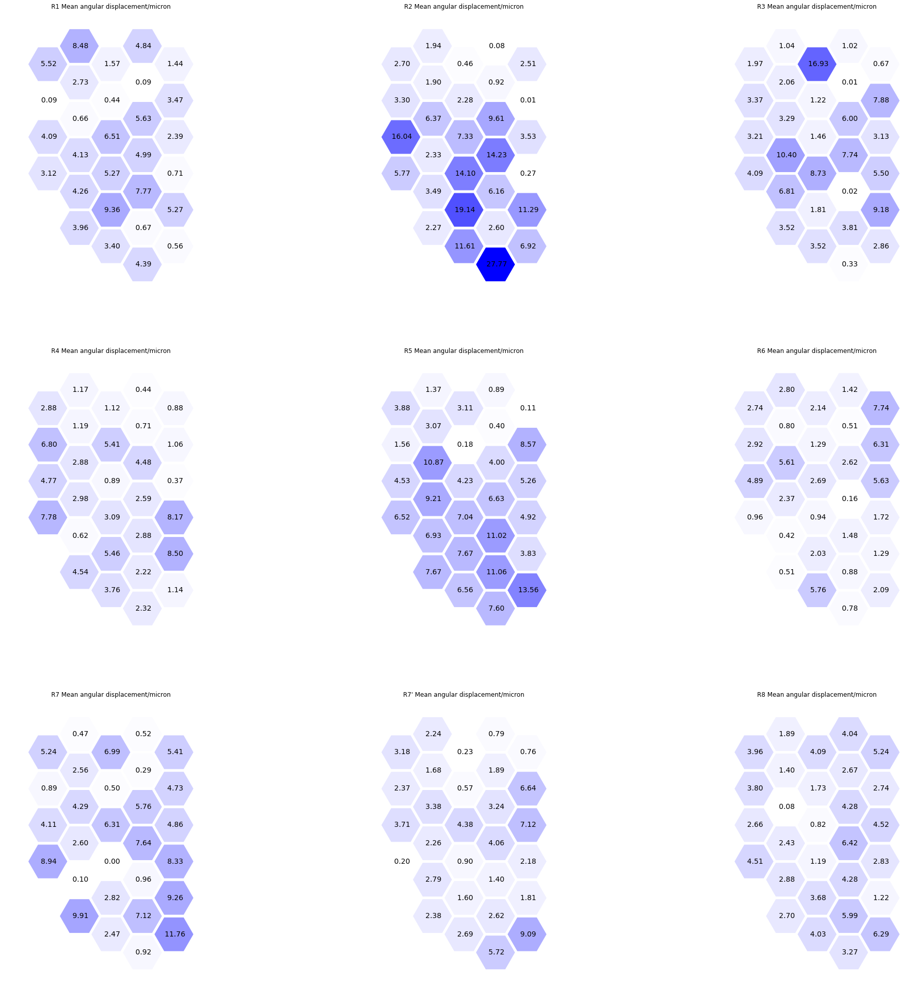

In [16]:
fig, axes = plt.subplots(3, 3, figsize=[35, 35])
# cm = linear_cmap(n_vals=100, max_colour=(1.0, 1.0, 1.0), min_colour='r')
cm = linear_cmap(n_vals=100, max_colour='b')
overall_max = abs(twist_results.loc[:, 'mean_diff']).max().max()

for ax, this_st in zip(axes.flatten(), subtypes):
    node_data = dict.fromkeys(all_om)
    this_max = abs(twist_results.loc[:, ('mean_diff', this_st)]).max()
    for om in all_om:
        x = abs(twist_results.loc[om, ('mean_diff', this_st)])
        node_data[om] = {'label': f"{x: .2f}",
                        'colour': cm(x/overall_max)}
    ax.set_title(f"{this_st} Mean angular displacement/micron")
    hexplot(node_data=node_data, ax=ax)

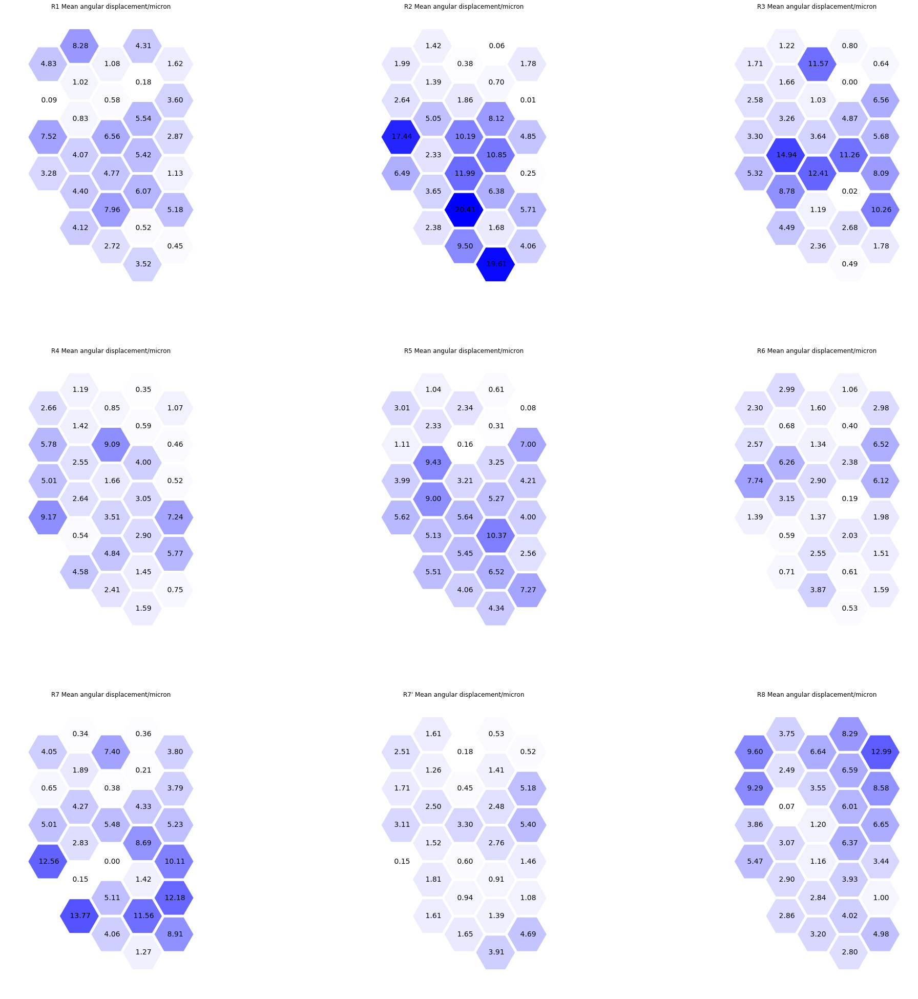

In [17]:
fig, axes = plt.subplots(3, 3, figsize=[35, 35])
# cm = linear_cmap(n_vals=100, max_colour=(1.0, 1.0, 1.0), min_colour='r')
cm = linear_cmap(n_vals=100, max_colour='b')
overall_max = abs(twist_results.loc[:, 'mean_diff_per_micron']).max().max()

for ax, this_st in zip(axes.flatten(), subtypes):
    node_data = dict.fromkeys(all_om)
    this_max = abs(twist_results.loc[:, ('mean_diff_per_micron', this_st)]).max()
    for om in all_om:
        x = abs(twist_results.loc[om, ('mean_diff_per_micron', this_st)])
        node_data[om] = {'label': f"{x: .2f}",
                        'colour': cm(x/overall_max)}
    ax.set_title(f"{this_st} Mean angular displacement/micron")
    hexplot(node_data=node_data, ax=ax)

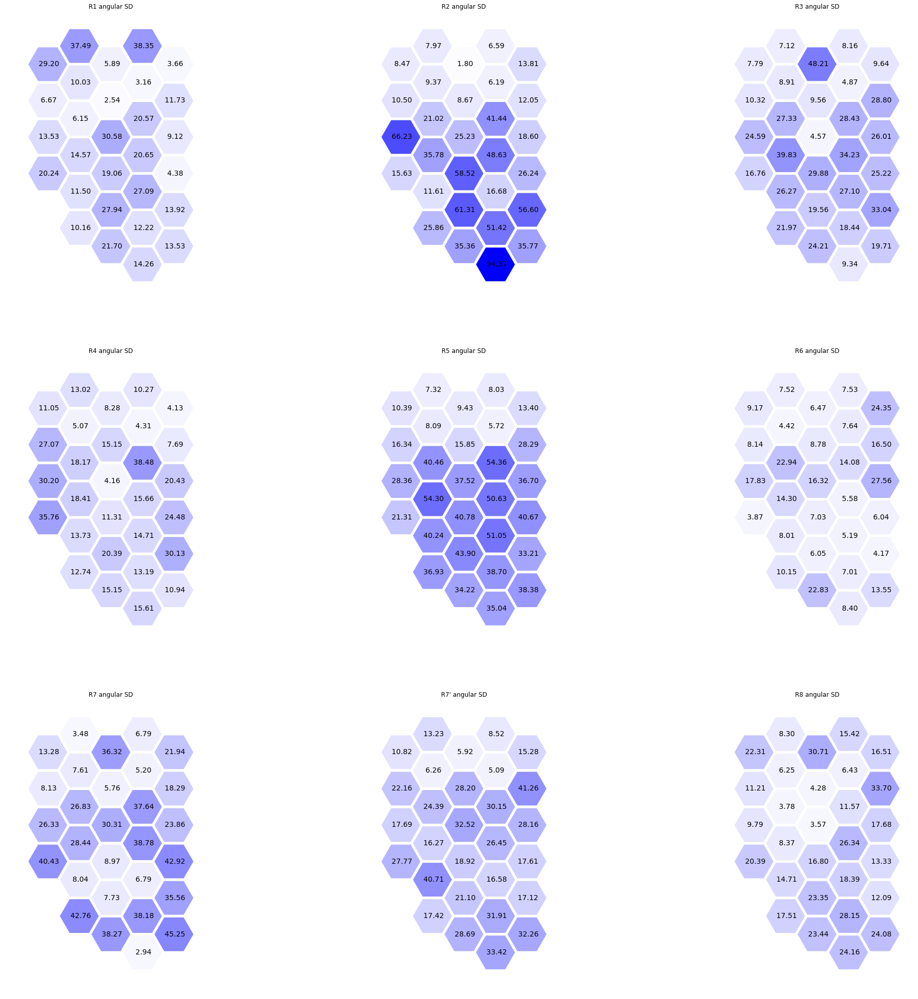

In [18]:
fig, axes = plt.subplots(3, 3, figsize=[35, 35])
# cm = linear_cmap(n_vals=100, max_colour=(1.0, 1.0, 1.0), min_colour='r')
cm = linear_cmap(n_vals=100, max_colour='b')
overall_max = abs(twist_results.loc[:, 'SD_displacement']).max().max()

for ax, this_st in zip(axes.flatten(), subtypes):
    node_data = dict.fromkeys(all_om)
    this_max = abs(twist_results.loc[:, ('SD_displacement', this_st)]).max()
    for om in all_om:
        x = abs(twist_results.loc[om, ('SD_displacement', this_st)])
        node_data[om] = {'label': f"{x: .2f}",
                        'colour': cm(x/overall_max)}
    ax.set_title(f"{this_st} angular SD")
    hexplot(node_data=node_data, ax=ax)

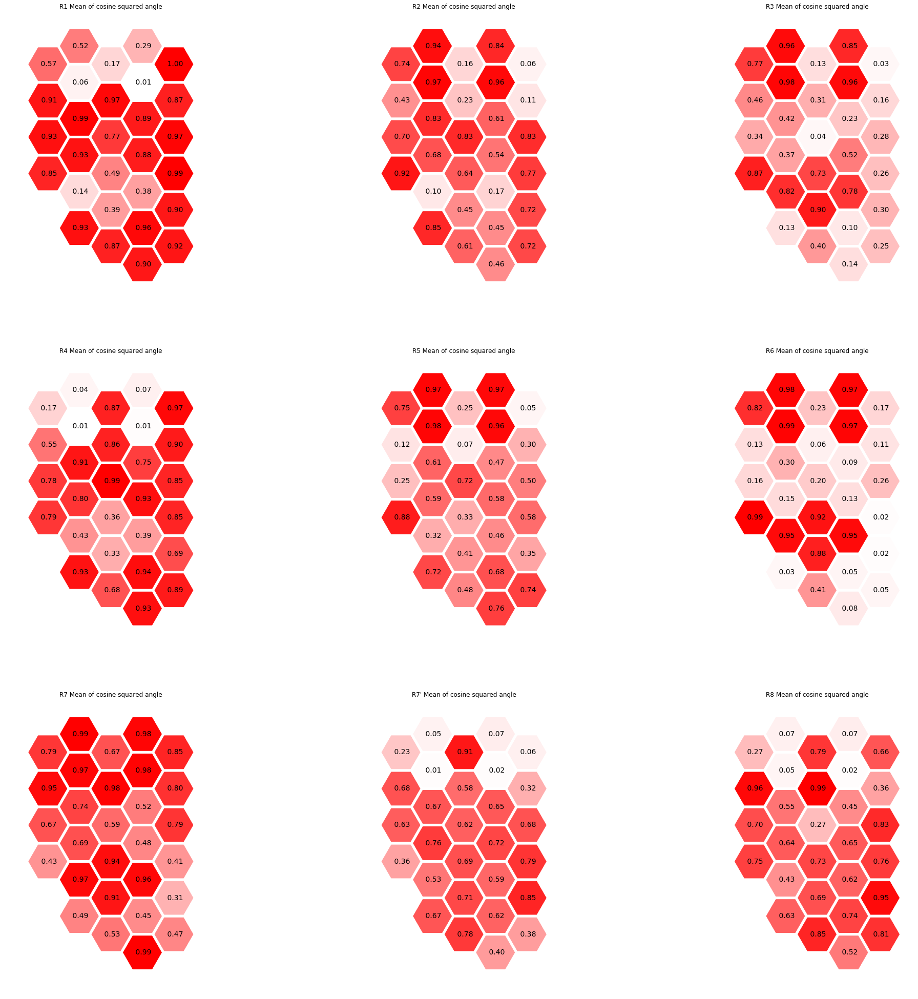

In [19]:


fig, axes = plt.subplots(3, 3, figsize=[35, 35])
# cm = linear_cmap(n_vals=100, max_colour=(1.0, 1.0, 1.0), min_colour='r')
cm = linear_cmap(n_vals=100, max_colour='r')

for ax, this_st in zip(axes.flatten(), subtypes):
    node_data = dict.fromkeys(all_om)
    this_max = twist_results.loc[:, ('mean_cosine_sq', this_st)].max()
    for om in all_om:
        data = twist_results.loc[om, ('mean_cosine_sq', this_st)]
        node_data[om] = {'label': f"{data: .2f}",
                        'colour': cm(data)}
    ax.set_title(f"{this_st} Mean of cosine squared angle")
    hexplot(node_data=node_data, ax=ax)

In [20]:
s, p, = mannwhitneyu(r7_sd[dra_om], r7_sd[ndra_om], alternative='less')
print("###### RESULTS ######")
print(f"Test statistic: {s}, p-value: {p: .6f}")
if p > 0.01:
    print("Fail to reject null")
else:
    print("Reject null: DRA R7 receive more inputs")

NameError: name 'r7_sd' is not defined

In [ ]:
s, p, = mannwhitneyu(r7p_sd[dra_om], r7p_sd[ndra_om], alternative='less')
print("###### RESULTS ######")
print(f"Test statistic: {s}, p-value: {p: .6f}")
if p > 0.01:
    print("Fail to reject null")
else:
    print("Reject null: DRA R7 receive more inputs")